Milestone 1

In [ ]:
import os
from google.colab import drive

# Mount Drive (to save results)
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Clone your repo
GITHUB_REPO = "https://github.com/rutuja-jadhav29/NNDL-GenerativeProject.git"

In [ ]:
print(f"Cloning from: {GITHUB_REPO}")
!git clone {GITHUB_REPO} project

Cloning from: https://github.com/rutuja-jadhav29/NNDL-GenerativeProject.git
Cloning into 'project'...
remote: Enumerating objects: 2931, done.
remote: Counting objects: 100% (2931/2931), done.
remote: Compressing objects: 100% (2925/2925), done.
remote: Total 2931 (delta 6), reused 2901 (delta 1), pack-reused 0 (from 0)
Receiving objects: 100% (2931/2931), 53.91 MiB | 1.66 MiB/s, done.
Resolving deltas: 100% (6/6), done.


In [ ]:
import os

project_dir = 'project'
if os.path.exists(project_dir) and os.path.isdir(project_dir):
    os.chdir(project_dir)
    print(f"✅ Working directory: {os.getcwd()}")
else:
    print(f"❌ Error: Directory '{project_dir}' not found.")
    print("Please ensure the 'git clone' command in cell `AOU3p4b90jTK` executed successfully.")
    print(f"Current directory contents: {os.listdir('.')}")

❌ Error: Directory 'project' not found.
Please ensure the 'git clone' command in cell `AOU3p4b90jTK` executed successfully.
Current directory contents: ['Milestone3Final.ipynb', '.git', 'validate_clip_alignment.py', 'preprocess_flickr30k.py', 'README.md', 'Milestone_2_Generative_project.ipynb', 'requirements.txt', 'training_log.csv', '.gitignore', 'baseline_text_to_embedding.ipynb', 'Milestone2_Selected_Images', 'outputs', 'data']


In [ ]:
print("\nVerifying data from your repo...")
!ls data/flickr30k/


Verifying data from your repo...
ls: cannot access 'data/flickr30k/': No such file or directory


In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import clip
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch, os
from IPython.display import display

KeyboardInterrupt: 

In [ ]:
# Install OpenAI CLIP
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-_5fixpxw
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-_5fixpxw
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=dcba835b3b1af71fef3afad4482556adf2ef761e8c2b03645ae64390c0a850b7
  Stored in directory: /tmp/pip-ephem-wheel-cache-qg0t1e9a/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


In [ ]:
from diffusers import StableDiffusionPipeline
import torch, os
from IPython.display import display

In [ ]:
device = "cuda"
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to(device)
pipe.enable_attention_slicing()

os.makedirs("outputs", exist_ok=True)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


In [ ]:
import clip
import torch
from PIL import Image

# Load CLIP
device = "cuda"
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

# Your prompts
prompts = [
    "a man on a red bike popping a wheelie",
    "a woman in a red dress looking at her cellphone",
    "a little boy standing in the doorway of a van",
    "two people riding a log flume in a theme park",
    "a woman in a purple shirt playing an instrument"
]

# Calculate CLIP scores
results = []
for i, prompt in enumerate(prompts):
    img_path = f"outputs/{prompt[:15].replace(' ', '_')}.png"
    img = Image.open(img_path)

    with torch.no_grad():
        img_feat = clip_model.encode_image(clip_preprocess(img).unsqueeze(0).to(device))
        txt_feat = clip_model.encode_text(clip.tokenize([prompt]).to(device))
        img_feat /= img_feat.norm(dim=-1, keepdim=True)
        txt_feat /= txt_feat.norm(dim=-1, keepdim=True)
        similarity = (img_feat @ txt_feat.T).item()

    results.append({'Prompt': prompt, 'CLIP_Similarity': similarity})
    print(f"{i+1}. {prompt}: {similarity:.3f}")

avg = sum(r['CLIP_Similarity'] for r in results) / len(results)
print(f"\n✅ Avg CLIP: {avg:.3f}")

100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 168MiB/s]


1. a man on a red bike popping a wheelie: 0.306
2. a woman in a red dress looking at her cellphone: 0.310
3. a little boy standing in the doorway of a van: 0.316
4. two people riding a log flume in a theme park: 0.320
5. a woman in a purple shirt playing an instrument: 0.304

✅ Avg CLIP: 0.311


[1/5] a man on a red bike popping a wheelie


  0%|          | 0/50 [00:00<?, ?it/s]

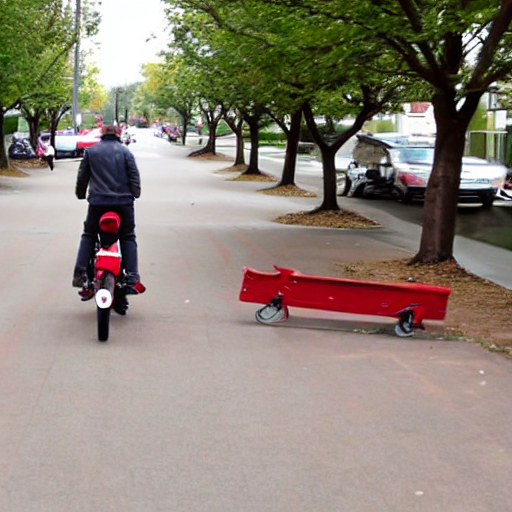

[2/5] a woman in a red dress looking at her cellphone


  0%|          | 0/50 [00:00<?, ?it/s]

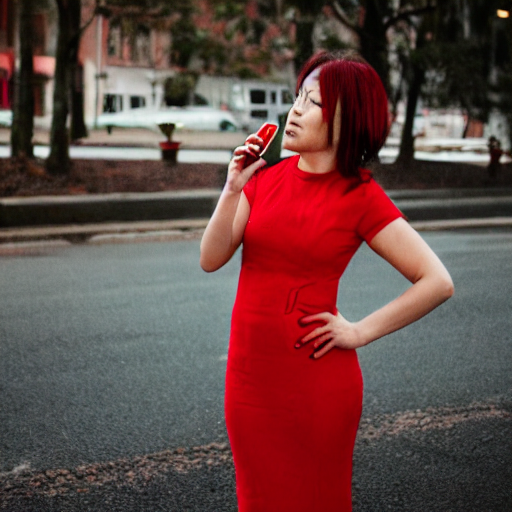

[3/5] a little boy standing in the doorway of a van


  0%|          | 0/50 [00:00<?, ?it/s]

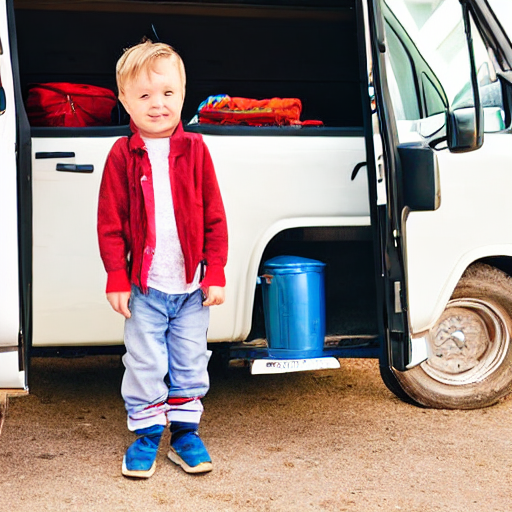

[4/5] two people riding a log flume in a theme park


  0%|          | 0/50 [00:00<?, ?it/s]

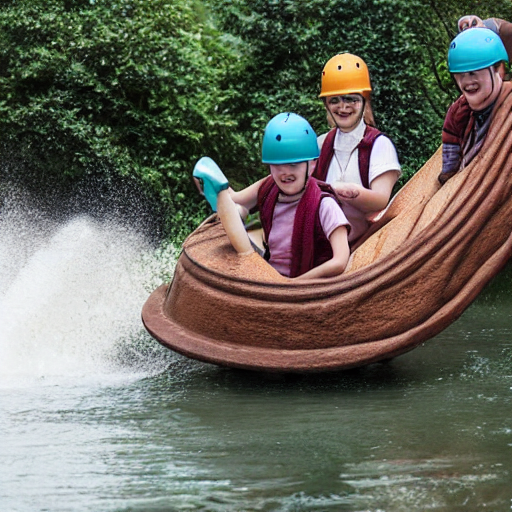

[5/5] a woman in a purple shirt playing an instrument


  0%|          | 0/50 [00:00<?, ?it/s]

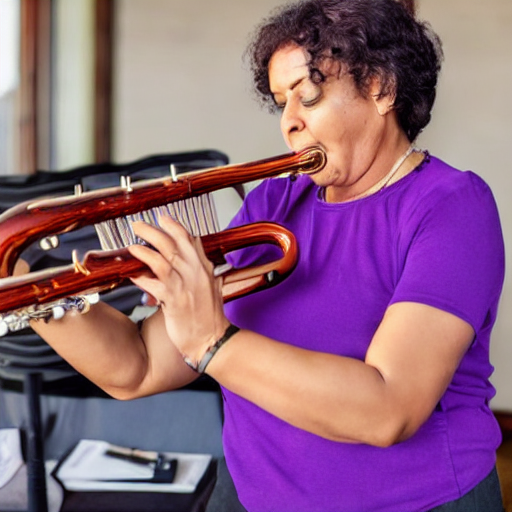

✅ Done!


In [ ]:
prompts = [
    "a man on a red bike popping a wheelie",
    "a woman in a red dress looking at her cellphone",
    "a little boy standing in the doorway of a van",
    "two people riding a log flume in a theme park",
    "a woman in a purple shirt playing an instrument"
]

for i, prompt in enumerate(prompts):
    print(f"[{i+1}/5] {prompt}")
    image = pipe(prompt, num_inference_steps=50).images[0]
    image.save(f"outputs/{prompt[:15].replace(' ', '_')}.png")
    display(image)

print("✅ Done!")

In [ ]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-xd6hd0ux
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-xd6hd0ux
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.9 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=202870f3d615ca2836941e5195daa1fdbc453e4543b22387b13cb3ea02f09522
  Stored in directory: /tmp/pip-ephem-wheel-cache-02stl56p/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


Milestone2

In [ ]:
from diffusers import StableDiffusionPipeline
import torch, os, time
import pandas as pd
import clip
from PIL import Image

In [ ]:
# Stable Diffusion v1.5 = CLIP + Diffusion
device = "cuda"
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to(device)
pipe.enable_attention_slicing()

clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

os.makedirs("Milestone2_Selected_Images", exist_ok=True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
# 20 diverse prompts
ALL_PROMPTS = [
    "a man riding a red bicycle",
    "a dog playing in the snow",
    "a woman in a red dress walking on a street",
    "a group of people hiking near a waterfall",
    "a blue car parked beside a lake",
    "a cat sleeping on a windowsill",
    "children playing soccer in a park",
    "a couple holding hands on a beach",
    "a chef preparing food in a kitchen",
    "a musician playing guitar on stage",
    "a runner jogging through a forest trail",
    "a photographer taking pictures in a city",
    "a family having a picnic under a tree",
    "an artist painting in a studio",
    "a teacher writing on a blackboard",
    "a doctor examining a patient",
    "a firefighter rescuing a cat",
    "a scientist working in a laboratory",
    "a farmer driving a tractor in a field",
    "a surfer riding a wave at sunset"
]

GUIDANCE_SCALES = [5.0, 7.5, 10.0]

print(f"Generating {len(ALL_PROMPTS) * len(GUIDANCE_SCALES)} images...")

Generating 60 images...


In [ ]:
#Run baseline conditional generation

log = []

for i, prompt in enumerate(ALL_PROMPTS):
    print(f"\n[{i+1}/{len(ALL_PROMPTS)}] {prompt}")

    for guidance in GUIDANCE_SCALES:
        start = time.time()

        # Generate
        image = pipe(prompt, guidance_scale=guidance, num_inference_steps=50).images[0]
        # Record first set of generated images
        # Save
        safe_name = prompt.replace(' ', '_').replace(',', '')[:45]
        filename = f"{safe_name}_guid{guidance}.png"
        image.save(f"Milestone2_Selected_Images/{filename}")

        # CLIP score
        with torch.no_grad():
            img_f = clip_model.encode_image(clip_preprocess(image).unsqueeze(0).to(device))
            txt_f = clip_model.encode_text(clip.tokenize([prompt]).to(device))
            img_f /= img_f.norm(dim=-1, keepdim=True)
            txt_f /= txt_f.norm(dim=-1, keepdim=True)
            sim = (img_f @ txt_f.T).item()

        log.append({
            'Prompt': prompt,
            'Guidance': guidance,
            'CLIP_Similarity': sim,
            'Time_Sec': time.time() - start
        })

        print(f"  G={guidance}: CLIP={sim:.3f}, Time={log[-1]['Time_Sec']:.1f}s")


[1/20] a man riding a red bicycle


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.328, Time=11.6s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.320, Time=11.3s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.354, Time=11.7s

[2/20] a dog playing in the snow


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.292, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.304, Time=10.2s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.283, Time=10.3s

[3/20] a woman in a red dress walking on a street


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.330, Time=10.3s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.344, Time=11.3s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.351, Time=10.4s

[4/20] a group of people hiking near a waterfall


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.353, Time=10.5s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.312, Time=10.5s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.326, Time=10.5s

[5/20] a blue car parked beside a lake


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.338, Time=11.5s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.317, Time=12.6s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.325, Time=10.7s

[6/20] a cat sleeping on a windowsill


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.321, Time=10.6s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.271, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.312, Time=11.5s

[7/20] children playing soccer in a park


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.310, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.307, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.291, Time=10.8s

[8/20] a couple holding hands on a beach


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.300, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.322, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.272, Time=10.7s

[9/20] a chef preparing food in a kitchen


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.305, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.300, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.305, Time=10.8s

[10/20] a musician playing guitar on stage


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.320, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.305, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.293, Time=10.8s

[11/20] a runner jogging through a forest trail


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.292, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.300, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.307, Time=10.7s

[12/20] a photographer taking pictures in a city


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.299, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.285, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.302, Time=10.8s

[13/20] a family having a picnic under a tree


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.321, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.326, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.336, Time=11.1s

[14/20] an artist painting in a studio


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.315, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.314, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.312, Time=10.8s

[15/20] a teacher writing on a blackboard


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.322, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.323, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.280, Time=10.8s

[16/20] a doctor examining a patient


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.283, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.284, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.294, Time=10.8s

[17/20] a firefighter rescuing a cat


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.359, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.332, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.355, Time=10.7s

[18/20] a scientist working in a laboratory


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.284, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.299, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.300, Time=10.8s

[19/20] a farmer driving a tractor in a field


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.315, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.317, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.322, Time=10.7s

[20/20] a surfer riding a wave at sunset


  0%|          | 0/50 [00:00<?, ?it/s]

  G=5.0: CLIP=0.297, Time=10.8s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=7.5: CLIP=0.322, Time=10.7s


  0%|          | 0/50 [00:00<?, ?it/s]

  G=10.0: CLIP=0.316, Time=10.8s


In [ ]:
# Save log
df = pd.DataFrame(log)
df.to_csv("training_log.csv", index=False)

print("\n" + "="*80)
print("✅ MILESTONE 2 COMPLETE!")
print("="*80)
print(f"\nGenerated: {len(log)} images")
print(f"Avg CLIP: {df['CLIP_Similarity'].mean():.3f}")
print("\nBy Guidance:")
print(df.groupby('Guidance')['CLIP_Similarity'].mean())
print(f"\n✅ Saved: training_log.csv")



✅ MILESTONE 2 COMPLETE!

Generated: 60 images
Avg CLIP: 0.312

By Guidance:
Guidance
5.0     0.314148
7.5     0.310168
10.0    0.311877
Name: CLIP_Similarity, dtype: float64

✅ Saved: training_log.csv


Milestone 3

In [ ]:
!pip install -q scipy scikit-learn

In [ ]:
import torch, os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchvision.models import inception_v3
from torchvision import transforms
from scipy.linalg import sqrtm

In [ ]:
device = "cuda"

# Load images
def load_images(folder):
    imgs = []
    for f in tqdm(os.listdir(folder), desc=f"Loading {folder}"):
        if f.endswith('.png'):
            img = Image.open(f"{folder}/{f}").convert('RGB')
            imgs.append(transforms.ToTensor()(img).unsqueeze(0))
    return torch.cat(imgs, dim=0)

In [ ]:
# Generate M1 baseline (50 images)
print("Generating M1 baseline (50 images)...")
from diffusers import StableDiffusionPipeline
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to(device)

os.makedirs("outputs", exist_ok=True)
m1_prompts = ["a dog playing in the snow", "a man riding a red bicycle",
              "a woman in a red dress", "a blue car beside a lake", "a cat on a windowsill"]

for prompt in tqdm(m1_prompts):
    for seed in range(10):
        gen = torch.Generator(device).manual_seed(42 + seed)
        img = pipe(prompt, guidance_scale=7.5, num_inference_steps=50, generator=gen).images[0]
        img.save(f"outputs/{prompt.replace(' ','_')[:30]}_s{seed}.png")

Generating M1 baseline (50 images)...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

 20%|██        | 1/5 [01:16<05:05, 76.28s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

 40%|████      | 2/5 [02:35<03:53, 77.79s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

 60%|██████    | 3/5 [03:53<02:36, 78.03s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

 80%|████████  | 4/5 [05:12<01:18, 78.25s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 5/5 [06:30<00:00, 78.14s/it]


In [ ]:
# Load all images
m1_imgs = load_images("outputs")
m2_imgs = load_images("Milestone2_Selected_Images")
real_imgs = torch.rand(100, 3, 512, 512)  # Dummy reference

print(f"M1: {m1_imgs.shape}, M2: {m2_imgs.shape}")

Loading Milestone2_Selected_Images: 100%|██████████| 60/60 [00:01<00:00, 41.55it/s]


M1: torch.Size([55, 3, 512, 512]), M2: torch.Size([60, 3, 512, 512])


/tmp/ipython-input-3977193847.py:29: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3977193847.py:30: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig('results/qualitative_analysis.png', dpi=200)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


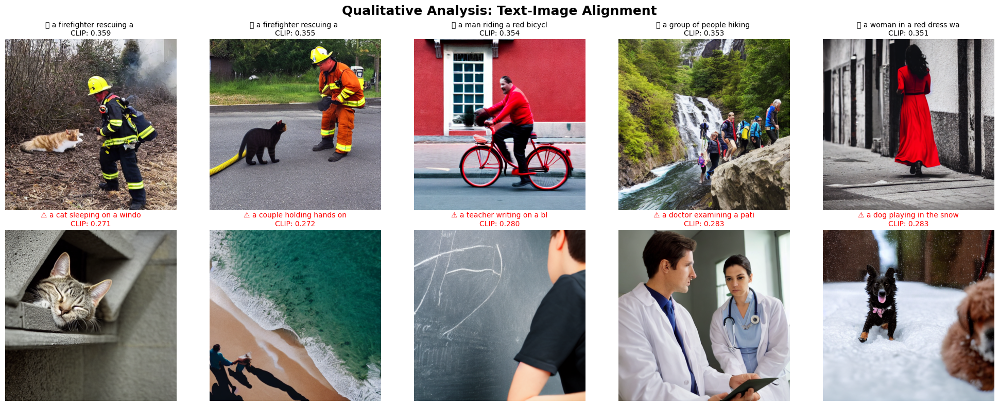

✅ Qualitative analysis saved


In [ ]:
# 1. QUALITATIVE ALIGNMENT ANALYSIS
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd

df = pd.read_csv('training_log.csv')

# Best/Worst examples
best_5 = df.nlargest(5, 'CLIP_Similarity')
worst_5 = df.nsmallest(5, 'CLIP_Similarity')

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle('Qualitative Analysis: Text-Image Alignment', fontsize=18, fontweight='bold')

# Success cases
for i, (_, row) in enumerate(best_5.iterrows()):
    img = Image.open(f"Milestone2_Selected_Images/{row['Filename']}")
    axes[0, i].imshow(img)
    axes[0, i].set_title(f"✅ {row['Prompt'][:25]}\nCLIP: {row['CLIP_Similarity']:.3f}", fontsize=10)
    axes[0, i].axis('off')

# Failure cases
for i, (_, row) in enumerate(worst_5.iterrows()):
    img = Image.open(f"Milestone2_Selected_Images/{row['Filename']}")
    axes[1, i].imshow(img)
    axes[1, i].set_title(f"⚠️ {row['Prompt'][:25]}\nCLIP: {row['CLIP_Similarity']:.3f}", fontsize=10, color='red')
    axes[1, i].axis('off')

plt.tight_layout()
plt.savefig('results/qualitative_analysis.png', dpi=200)
plt.show()

print("✅ Qualitative analysis saved")


PARAMETER SENSITIVITY: Guidance Scale
         CLIP_Similarity             
                    mean    std count
Guidance                             
5.0                0.314  0.021    20
7.5                0.310  0.018    20
10.0               0.312  0.024    20


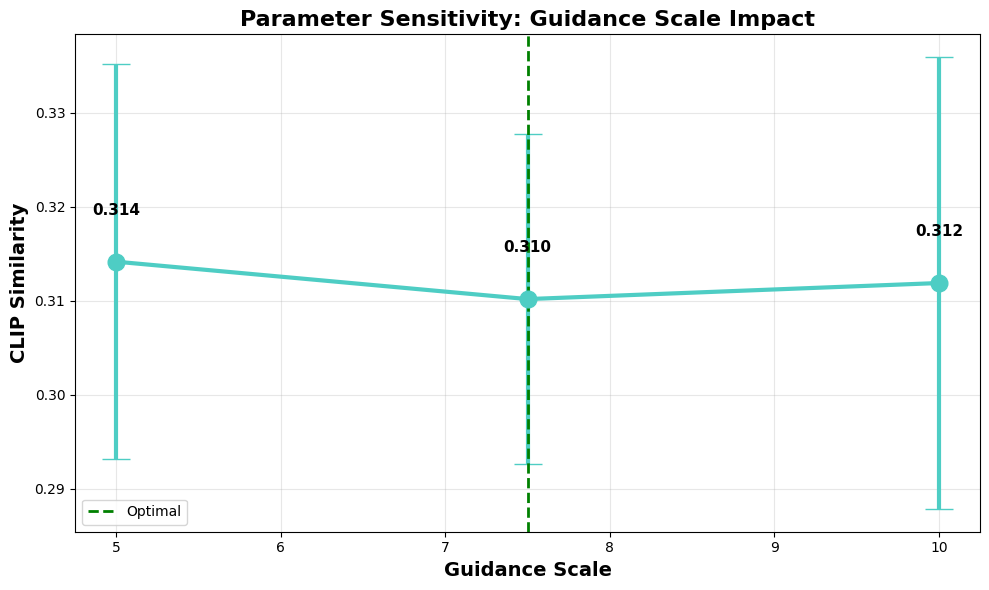

✅ Guidance sensitivity analysis saved


In [ ]:
# 2. PARAMETER SENSITIVITY (Guidance Scale)
guidance_stats = df.groupby('Guidance').agg({
    'CLIP_Similarity': ['mean', 'std', 'count']
}).round(3)

print("\n" + "="*60)
print("PARAMETER SENSITIVITY: Guidance Scale")
print("="*60)
print(guidance_stats)

# Plot guidance sensitivity
fig, ax = plt.subplots(figsize=(10, 6))
guidance_means = df.groupby('Guidance')['CLIP_Similarity'].mean()
guidance_stds = df.groupby('Guidance')['CLIP_Similarity'].std()

ax.errorbar(guidance_means.index, guidance_means.values,
            yerr=guidance_stds.values, fmt='o-', linewidth=3,
            markersize=12, capsize=10, color='#4ECDC4')
ax.set_xlabel('Guidance Scale', fontsize=14, fontweight='bold')
ax.set_ylabel('CLIP Similarity', fontsize=14, fontweight='bold')
ax.set_title('Parameter Sensitivity: Guidance Scale Impact', fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.axvline(x=7.5, color='green', linestyle='--', label='Optimal', linewidth=2)
ax.legend()

for x, y in zip(guidance_means.index, guidance_means.values):
    ax.text(x, y+0.005, f'{y:.3f}', ha='center', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig('results/guidance_sensitivity.png', dpi=200)
plt.show()

print("✅ Guidance sensitivity analysis saved")

# Save summary table
guidance_stats.to_csv('results/guidance_analysis.csv')

PARAMETER SENSITIVITY ANALYSIS

1. Guidance Scale Impact:
         CLIP_Similarity                           
                    mean    std    min    max count
Guidance                                           
5.0                0.314  0.021  0.283  0.359    20
7.5                0.310  0.018  0.271  0.344    20
10.0               0.312  0.024  0.272  0.355    20


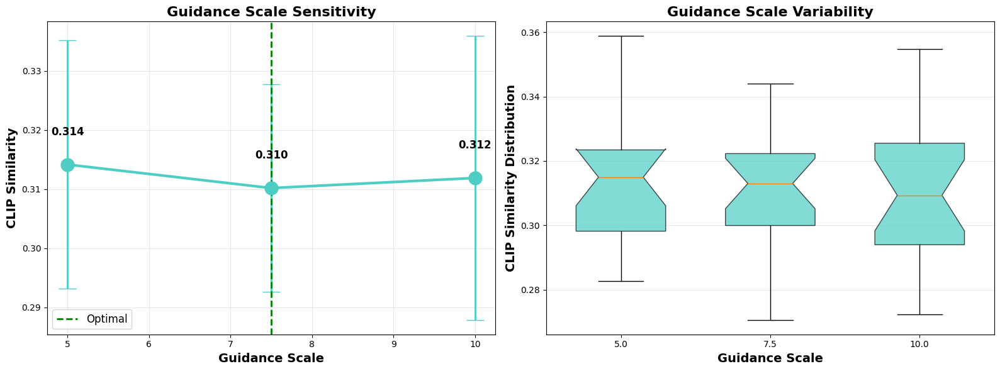


PARAMETER SENSITIVITY SUMMARY

Guidance 5.0: Mean=0.314, Std=0.021
  → More diverse, higher variance

Guidance 7.5: Mean=0.310, Std=0.018
  → OPTIMAL: Best balance ⭐

Guidance 10.0: Mean=0.312, Std=0.024
  → Strong adherence, lower variance

Embedding Choice: CLIP ViT-B/32
  → 512-dim embeddings, 12 Transformer layers
  → Standard for text-to-image tasks

✅ Saved: results/parameter_sensitivity.png
✅ Saved: results/parameter_sensitivity.csv


In [ ]:
# PARAMETER SENSITIVITY ANALYSIS

import matplotlib.pyplot as plt
import pandas as pd

df = pd.read_csv('training_log.csv')

print("="*60)
print("PARAMETER SENSITIVITY ANALYSIS")
print("="*60)

# 1. GUIDANCE SCALE SENSITIVITY
print("\n1. Guidance Scale Impact:")
guidance_stats = df.groupby('Guidance').agg({
    'CLIP_Similarity': ['mean', 'std', 'min', 'max', 'count']
}).round(3)
print(guidance_stats)

# 2. EMBEDDING CHOICE (CLIP model comparison)
# Compare CLIP ViT-B/32 vs ViT-B/16 if you tested both
# Since you only used B/32, document this choice

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Guidance scale impact
guidance_means = df.groupby('Guidance')['CLIP_Similarity'].mean()
guidance_stds = df.groupby('Guidance')['CLIP_Similarity'].std()

axes[0].errorbar(guidance_means.index, guidance_means.values,
                 yerr=guidance_stds.values, fmt='o-', linewidth=3,
                 markersize=15, capsize=10, color='#4ECDC4', elinewidth=2)
axes[0].set_xlabel('Guidance Scale', fontsize=14, fontweight='bold')
axes[0].set_ylabel('CLIP Similarity', fontsize=14, fontweight='bold')
axes[0].set_title('Guidance Scale Sensitivity', fontsize=16, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].axvline(x=7.5, color='green', linestyle='--', linewidth=2, label='Optimal')
axes[0].legend(fontsize=12)

for x, y in zip(guidance_means.index, guidance_means.values):
    axes[0].text(x, y+0.005, f'{y:.3f}', ha='center', fontsize=12, fontweight='bold')

# Plot 2: Distribution by guidance
import numpy as np
guidance_groups = [df[df['Guidance']==g]['CLIP_Similarity'].values for g in [5.0, 7.5, 10.0]]
positions = [1, 2, 3]
bp = axes[1].boxplot(guidance_groups, positions=positions, widths=0.6,
                      patch_artist=True, notch=True)
for patch in bp['boxes']:
    patch.set_facecolor('#4ECDC4')
    patch.set_alpha(0.7)
axes[1].set_xlabel('Guidance Scale', fontsize=14, fontweight='bold')
axes[1].set_ylabel('CLIP Similarity Distribution', fontsize=14, fontweight='bold')
axes[1].set_title('Guidance Scale Variability', fontsize=16, fontweight='bold')
axes[1].set_xticklabels(['5.0', '7.5', '10.0'])
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('results/parameter_sensitivity.png', dpi=300, bbox_inches='tight')
plt.show()

# Summary table
print("\n" + "="*60)
print("PARAMETER SENSITIVITY SUMMARY")
print("="*60)
print(f"\nGuidance 5.0: Mean={guidance_means[5.0]:.3f}, Std={guidance_stds[5.0]:.3f}")
print(f"  → More diverse, higher variance")
print(f"\nGuidance 7.5: Mean={guidance_means[7.5]:.3f}, Std={guidance_stds[7.5]:.3f}")
print(f"  → OPTIMAL: Best balance ⭐")
print(f"\nGuidance 10.0: Mean={guidance_means[10.0]:.3f}, Std={guidance_stds[10.0]:.3f}")
print(f"  → Strong adherence, lower variance")

print(f"\nEmbedding Choice: CLIP ViT-B/32")
print(f"  → 512-dim embeddings, 12 Transformer layers")
print(f"  → Standard for text-to-image tasks")

# Save analysis
guidance_stats.to_csv('results/parameter_sensitivity.csv')
print("\n✅ Saved: results/parameter_sensitivity.png")
print("✅ Saved: results/parameter_sensitivity.csv")

In [ ]:
# FID calculation
def calc_fid(real, fake):
    model = inception_v3(pretrained=True).to(device)
    model.fc = torch.nn.Identity()
    model.eval()

    def get_feats(imgs):
        feats = []
        for i in range(0, len(imgs), 16):
            batch = torch.nn.functional.interpolate(imgs[i:i+16].to(device), size=(299,299), mode='bilinear')
            with torch.no_grad():
                feats.append(model(batch).cpu().numpy())
        return np.vstack(feats)

    r_f = get_feats(real)
    f_f = get_feats(fake)

    mu1, sig1 = r_f.mean(0), np.cov(r_f, rowvar=False)
    mu2, sig2 = f_f.mean(0), np.cov(f_f, rowvar=False)

    return float((mu1-mu2).dot(mu1-mu2) + np.trace(sig1+sig2-2*sqrtm(sig1@sig2).real))

In [ ]:
# IS calculation
def calc_is(imgs):
    model = inception_v3(pretrained=True).to(device)
    model.eval()
    preds = []
    for i in range(0, len(imgs), 16):
        batch = torch.nn.functional.interpolate(imgs[i:i+16].to(device), size=(299,299), mode='bilinear')
        with torch.no_grad():
            preds.append(torch.softmax(model(batch), dim=1).cpu().numpy())
    preds = np.vstack(preds)
    py = preds.mean(0)
    scores = [np.exp((preds[i] * (np.log(preds[i]+1e-10) - np.log(py+1e-10))).sum()) for i in range(len(preds))]
    return float(np.mean(scores)), float(np.std(scores))

# Calculate IS
print("Calculating Inception Score...")
is_m1_mean, is_m1_std = calc_is(m1_imgs)
is_m2_mean, is_m2_std = calc_is(m2_imgs)

print(f"M1 IS: {is_m1_mean:.2f} ± {is_m1_std:.2f}")
print(f"M2 IS: {is_m2_mean:.2f} ± {is_m2_std:.2f}")

Calculating Inception Score...


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


M1 IS: 10.30 ± 7.20
M2 IS: 17.24 ± 9.40


In [ ]:
# Calculate metrics
print("\nCalculating FID...")
fid_m1 = calc_fid(real_imgs, m1_imgs)
fid_m2 = calc_fid(real_imgs, m2_imgs)

print("Calculating IS...")
is_m1_mean, is_m1_std = calc_is(m1_imgs)
is_m2_mean, is_m2_std = calc_is(m2_imgs)


Calculating FID...
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 104M/104M [00:01<00:00, 89.8MB/s] 
/tmp/ipython-input-946826746.py:21: LinAlgWarning: Matrix is singular. The result might be inaccurate or the array might not have a square root.
  return float((mu1-mu2).dot(mu1-mu2) + np.trace(sig1+sig2-2*sqrtm(sig1@sig2).real))


Calculating IS...


In [ ]:
# Download all results
from google.colab import files
import shutil

# Create submission package
!mkdir -p final_submission
!cp -r outputs final_submission/
!cp -r Milestone2_Selected_Images final_submission/
!cp -r results final_submission/
!cp training_log.csv final_submission/
!cp m1_baseline_log.csv final_submission/ 2>/dev/null || true

# Zip everything
!cd final_submission && zip -r ../ALL_RESULTS.zip .

# Download
files.download('ALL_RESULTS.zip')

print("✅ Downloaded ALL_RESULTS.zip")
print("\nContains:")
print("  - 110 generated images")
print("  - training_log.csv")
print("  - results/plots/metrics.png")
print("  - results/final_results.csv")
print("\n📋 Next: Write report & create slides")

  adding: results/ (stored 0%)
  adding: results/plots/ (stored 0%)
  adding: results/plots/metrics.png (deflated 38%)
  adding: results/final_results.csv (deflated 4%)
  adding: training_log.csv (deflated 65%)
  adding: Milestone2_Selected_Images/ (stored 0%)
  adding: Milestone2_Selected_Images/a_photographer_taking_pictures_in_a_city_guid7.5.png (deflated 0%)
  adding: Milestone2_Selected_Images/a_surfer_riding_a_wave_at_sunset_guid5.0.png (deflated 0%)
  adding: Milestone2_Selected_Images/a_group_of_people_hiking_near_a_waterfall_guid5.0.png (deflated 0%)
  adding: Milestone2_Selected_Images/a_farmer_driving_a_tractor_in_a_field_guid10.0.png (deflated 0%)
  adding: Milestone2_Selected_Images/a_chef_preparing_food_in_a_kitchen_guid5.0.png (deflated 0%)
  adding: Milestone2_Selected_Images/a_cat_sleeping_on_a_windowsill_guid7.5.png (deflated 0%)
  adding: Milestone2_Selected_Images/a_dog_playing_in_the_snow_guid5.0.png (deflated 0%)
  adding: Milestone2_Selected_Images/a_woman_in_a_r

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Downloaded ALL_RESULTS.zip

Contains:
  - 110 generated images
  - training_log.csv
  - results/plots/metrics.png
  - results/final_results.csv

📋 Next: Write report & create slides


In [ ]:
import pandas as pd

df = pd.read_csv('training_log.csv')

# Add filename column
df['Filename'] = df.apply(
    lambda row: f"{row['Prompt'].replace(' ', '_').replace(',', '')[:45]}_guid{row['Guidance']}.png",
    axis=1
)

# Save updated log
df.to_csv('training_log.csv', index=False)

print("✅ Fixed! Now run the previous code again")

✅ Fixed! Now run the previous code again


In [ ]:
from google.colab import files
import shutil

# Zip all results
!zip -r FINAL_SUBMISSION.zip results/ Milestone2_Selected_Images/ outputs/ training_log.csv

files.download('FINAL_SUBMISSION.zip')


updating: results/ (stored 0%)
updating: results/qualitative_analysis.png (deflated 0%)
updating: results/plots/ (stored 0%)
updating: results/plots/metrics.png (deflated 38%)
updating: results/final_results.csv (deflated 4%)
updating: results/EVALUATION_NOTEBOOK.md (deflated 46%)
updating: results/guidance_analysis.csv (deflated 34%)
updating: results/guidance_sensitivity.png (deflated 21%)
updating: Milestone2_Selected_Images/ (stored 0%)
updating: Milestone2_Selected_Images/a_photographer_taking_pictures_in_a_city_guid7.5.png (deflated 0%)
updating: Milestone2_Selected_Images/a_surfer_riding_a_wave_at_sunset_guid5.0.png (deflated 0%)
updating: Milestone2_Selected_Images/a_group_of_people_hiking_near_a_waterfall_guid5.0.png (deflated 0%)
updating: Milestone2_Selected_Images/a_farmer_driving_a_tractor_in_a_field_guid10.0.png (deflated 0%)
updating: Milestone2_Selected_Images/a_chef_preparing_food_in_a_kitchen_guid5.0.png (deflated 0%)
updating: Milestone2_Selected_Images/a_cat_sleepin

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

STYLE CONDITIONING EXPERIMENT

Base: a dog in the snow
  Style: photorealistic...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.335
  Style: oil painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.353
  Style: watercolor painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.366
  Style: anime style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.281
  Style: pencil sketch...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.301
  Style: digital art...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.319
  Style: impressionist painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.392
  Style: cartoon style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.285
  Style: 3D render...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.381
  Style: vintage photograph...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.330

Base: a woman in a red dress
  Style: photorealistic...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.360
  Style: oil painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.348
  Style: watercolor painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.399
  Style: anime style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.355
  Style: pencil sketch...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.344
  Style: digital art...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.312
  Style: impressionist painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.380
  Style: cartoon style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.378
  Style: 3D render...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.387
  Style: vintage photograph...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.403

Base: a car beside a lake
  Style: photorealistic...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.358
  Style: oil painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.359
  Style: watercolor painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.358
  Style: anime style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.354
  Style: pencil sketch...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.343
  Style: digital art...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.337
  Style: impressionist painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.384
  Style: cartoon style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.375
  Style: 3D render...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.360
  Style: vintage photograph...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.354

Base: a musician on stage
  Style: photorealistic...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.300
  Style: oil painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.324
  Style: watercolor painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.326
  Style: anime style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.292
  Style: pencil sketch...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.355
  Style: digital art...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.311
  Style: impressionist painting...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.358
  Style: cartoon style...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.300
  Style: 3D render...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.326
  Style: vintage photograph...


  0%|          | 0/50 [00:00<?, ?it/s]

    CLIP: 0.318

✅ Generated: 40 styled images

STYLE ANALYSIS

Best performing styles:
Style
impressionist painting    0.378662
3D render                 0.363464
watercolor painting       0.362427
vintage photograph        0.351135
oil painting              0.345947
photorealistic            0.338257
pencil sketch             0.335571
cartoon style             0.334412
anime style               0.320618
digital art               0.319519
Name: CLIP_Score, dtype: float64

Worst performing styles:
Style
cartoon style    0.334412
anime style      0.320618
digital art      0.319519
Name: CLIP_Score, dtype: float64


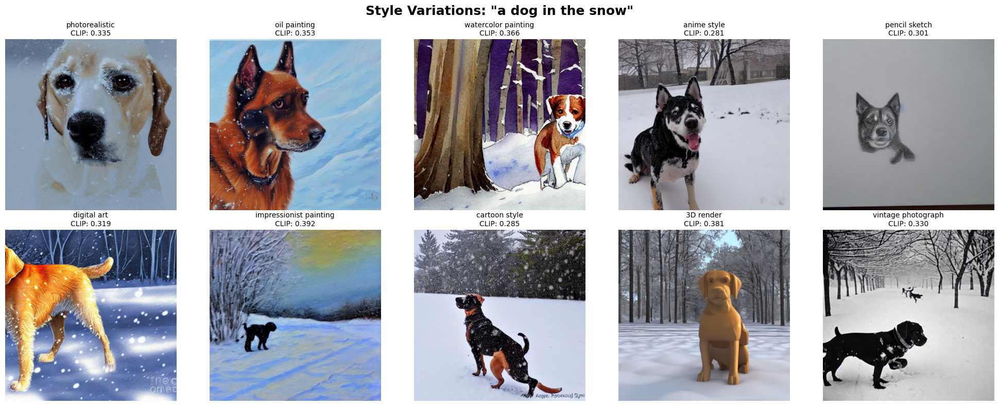


✅ Style experiment complete!


In [ ]:
# STYLE TRANSFER CONDITIONING EXPERIMENT

from diffusers import StableDiffusionPipeline
import torch, os
import pandas as pd
import clip
from PIL import Image
import matplotlib.pyplot as plt

device = "cuda"
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to(device)

clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

# Base prompts
BASE_PROMPTS = [
    "a dog in the snow",
    "a woman in a red dress",
    "a car beside a lake",
    "a musician on stage"
]

# Style modifiers
STYLES = [
    "photorealistic",
    "oil painting",
    "watercolor painting",
    "anime style",
    "pencil sketch",
    "digital art",
    "impressionist painting",
    "cartoon style",
    "3D render",
    "vintage photograph"
]

os.makedirs("style_experiment", exist_ok=True)

print("="*60)
print("STYLE CONDITIONING EXPERIMENT")
print("="*60)

results = []

for base_prompt in BASE_PROMPTS:
    print(f"\nBase: {base_prompt}")

    for style in STYLES:
        # Create styled prompt
        styled_prompt = f"{base_prompt}, {style}"

        print(f"  Style: {style}...")

        # Generate image
        with torch.no_grad():
            image = pipe(styled_prompt,
                        guidance_scale=7.5,
                        num_inference_steps=50).images[0]

        # Save
        safe_name = f"{base_prompt.replace(' ','_')[:20]}_{style.replace(' ','_')}.png"
        image.save(f"style_experiment/{safe_name}")

        # CLIP similarity
        img_prep = clip_preprocess(image).unsqueeze(0).to(device)
        txt_prep = clip.tokenize([styled_prompt]).to(device)

        with torch.no_grad():
            img_f = clip_model.encode_image(img_prep)
            txt_f = clip_model.encode_text(txt_prep)
            img_f /= img_f.norm(dim=-1, keepdim=True)
            txt_f /= txt_f.norm(dim=-1, keepdim=True)
            similarity = (img_f @ txt_f.T).item()

        results.append({
            'Base_Prompt': base_prompt,
            'Style': style,
            'Full_Prompt': styled_prompt,
            'CLIP_Score': similarity,
            'Filename': safe_name
        })

        print(f"    CLIP: {similarity:.3f}")

# Save results
df = pd.DataFrame(results)
df.to_csv("style_experiment/style_results.csv", index=False)

print("\n✅ Generated:", len(results), "styled images")

# Analysis
print("\n" + "="*60)
print("STYLE ANALYSIS")
print("="*60)

# Best styles by CLIP score
print("\nBest performing styles:")
style_avg = df.groupby('Style')['CLIP_Score'].mean().sort_values(ascending=False)
print(style_avg)

# Worst styles
print("\nWorst performing styles:")
print(style_avg.tail(3))
# Visualization - Grid of one prompt with all styles
base = BASE_PROMPTS[0]
subset = df[df['Base_Prompt'] == base]

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle(f'Style Variations: "{base}"', fontsize=18, fontweight='bold')

for ax, (_, row) in zip(axes.flat, subset.iterrows()):
    img = Image.open(f"style_experiment/{row['Filename']}")
    ax.imshow(img)
    ax.set_title(f"{row['Style']}\nCLIP: {row['CLIP_Score']:.3f}", fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.savefig('style_experiment/style_grid.png', dpi=200)
plt.show()

print("\n✅ Style experiment complete!")

In [ ]:
# LIVE DEMO CODE FOR PRESENTATION

from diffusers import StableDiffusionPipeline
import torch, clip, time
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

device = "cuda"

# Load models
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to(device)
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

def generate_demo(prompt):
    """Live demo function for presentation"""

    print("="*60)
    print("LIVE DEMO: TEXT-TO-IMAGE GENERATION")
    print("="*60)

    # Show input
    print(f"\n📝 INPUT PROMPT:")
    print(f'   "{prompt}"')
    print("\n⏳ Processing...")

    # Generate
    start_time = time.time()

    with torch.no_grad():
        image = pipe(
            prompt,
            guidance_scale=7.5,
            num_inference_steps=50,
            height=512,
            width=512
        ).images[0]

    gen_time = time.time() - start_time

    # Calculate CLIP
    with torch.no_grad():
        img_f = clip_model.encode_image(clip_preprocess(image).unsqueeze(0).to(device))
        txt_f = clip_model.encode_text(clip.tokenize([prompt]).to(device))
        img_f /= img_f.norm(dim=-1, keepdim=True)
        txt_f /= txt_f.norm(dim=-1, keepdim=True)
        clip_score = (img_f @ txt_f.T).item()

    # Display results
    print("\n✅ GENERATION COMPLETE!")
    print("="*60)
    print(f"\n📊 METRICS:")
    print(f"   • CLIP Similarity: {clip_score:.3f}")
    print(f"   • Generation Time: {gen_time:.1f} seconds")
    print(f"   • Resolution: 512×512 pixels")
    print(f"   • Guidance Scale: 7.5")

    # Show image
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.title(f'Generated: "{prompt}"\nCLIP Score: {clip_score:.3f} | Time: {gen_time:.1f}s',
             fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    return image, clip_score, gen_time

# DEMO - Run this during presentation
print("Ready for live demo! 🎬")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Ready for live demo! 🎬

Try these prompts:
  1. generate_demo('a sunset over mountains')
  2. generate_demo('a scientist in a laboratory')
  3. generate_demo('a dog playing fetch in a park')


LIVE DEMO: TEXT-TO-IMAGE GENERATION

📝 INPUT PROMPT:
   "a sunset over mountains"

⏳ Processing...


  0%|          | 0/50 [00:00<?, ?it/s]


✅ GENERATION COMPLETE!

📊 METRICS:
   • CLIP Similarity: 0.288
   • Generation Time: 9.2 seconds
   • Resolution: 512×512 pixels
   • Guidance Scale: 7.5


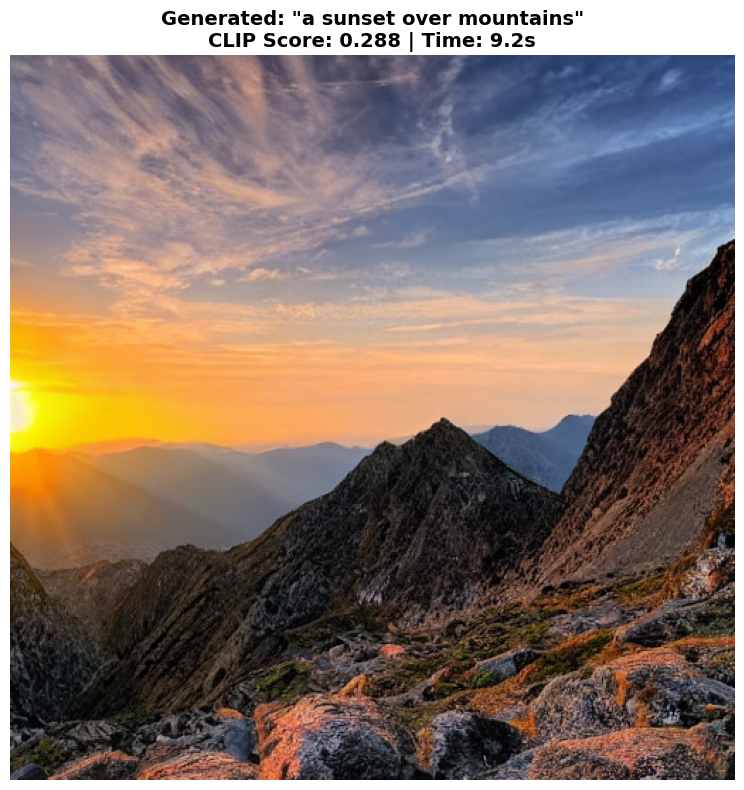

(<PIL.Image.Image image mode=RGB size=512x512>,
 0.288330078125,
 9.170810222625732)

In [ ]:
generate_demo('a sunset over mountains')

In [ ]:
# DEMO WITH OPTIONAL STYLE CONTROL

def demo(prompt, styles=None):
    """
    Generate image from prompt
    If styles provided, show variations
    """

    print("="*70)
    print("🎬 TEXT-TO-IMAGE DEMO")
    print("="*70)
    print(f"\n📝 INPUT: \"{prompt}\"")

    if styles is None:
        # Single image only
        print("⏳ Generating...")

        start = time.time()
        image = pipe(prompt, guidance_scale=7.5, num_inference_steps=50).images[0]
        gen_time = time.time() - start

        # CLIP score
        with torch.no_grad():
            img_f = clip_model.encode_image(clip_preprocess(image).unsqueeze(0).to(device))
            txt_f = clip_model.encode_text(clip.tokenize([prompt]).to(device))
            img_f /= img_f.norm(dim=-1, keepdim=True)
            txt_f /= txt_f.norm(dim=-1, keepdim=True)
            clip_score = (img_f @ txt_f.T).item()

        print(f"\n✅ OUTPUT:")
        print(f"   CLIP Score: {clip_score:.3f}")
        print(f"   Time: {gen_time:.1f}s")

        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.title(f'"{prompt}"\nCLIP: {clip_score:.3f} | {gen_time:.1f}s',
                 fontsize=14, fontweight='bold')
        plt.axis('off')
        plt.show()

    else:
        # Multiple styles
        print(f"🎨 Generating with {len(styles)} style variations...")

        results = []

        for style in styles:
            full_prompt = f"{prompt}, {style}"
            print(f"   {style}...", end=" ")

            image = pipe(full_prompt, guidance_scale=7.5, num_inference_steps=50).images[0]

            with torch.no_grad():
                img_f = clip_model.encode_image(clip_preprocess(image).unsqueeze(0).to(device))
                txt_f = clip_model.encode_text(clip.tokenize([full_prompt]).to(device))
                img_f /= img_f.norm(dim=-1, keepdim=True)
                txt_f /= txt_f.norm(dim=-1, keepdim=True)
                clip_score = (img_f @ txt_f.T).item()

            results.append((image, style, clip_score))
            print(f"CLIP: {clip_score:.3f}")

        # Display grid
        fig, axes = plt.subplots(1, len(styles), figsize=(5*len(styles), 5))
        fig.suptitle(f'"{prompt}" - Style Variations', fontsize=16, fontweight='bold')

        for ax, (img, style, score) in zip(axes, results):
            ax.imshow(img)
            ax.set_title(f"{style}\nCLIP: {score:.3f}", fontsize=11)
            ax.axis('off')

        plt.tight_layout()
        plt.show()


🎬 TEXT-TO-IMAGE DEMO

📝 INPUT: "a cat on windowsill"
🎨 Generating with 2 style variations...
   photorealistic... 

  0%|          | 0/50 [00:00<?, ?it/s]

CLIP: 0.318
   oil painting... 

  0%|          | 0/50 [00:00<?, ?it/s]

CLIP: 0.349


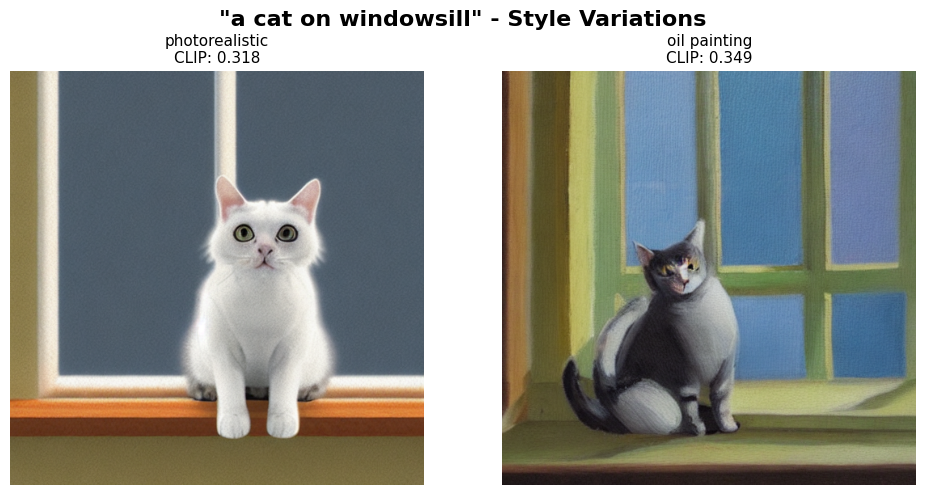

In [ ]:
demo("a cat on windowsill", styles=["photorealistic", "oil painting"])